<h1 align="center">Hacettepe University <br> Department of Computer Science </h1> 

<h2 align="center">BBM 415 - Fundamentals of Image Processing Laboratory<br>2022 Fall</h2>

<h3 align="center">Assignment 3</h3>
<h3 align="left">Name    :    Murat Çelik</h3>
<h3 align="left">ID      :    21827263</h3>
<h4 align="right">Due on December 12, 2022</h4>

# Using Image Pyramid for Image Blending

- Image blending is a photo editing technique used by many companies. In this task, I implement the Image Blending technique using image pyramids. I analyze the outputs by sharing them.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt


## 1. Image Blending Function

In [2]:
def image_blending(A,B,mask,level):
    
    # 1. Build Laplacian pyramids for each image.
    # 1.1.1 generate Gaussian pyramid for A
    G = A.copy()
    gpA = [G]
    for i in range(level):
        G = cv2.pyrDown(G)
        gpA.append(G)
    # 1.1.2generate Laplacian Pyramid for A
    lpA = [gpA[level-1]]
    for i in range(level-1,0,-1):
        GE = cv2.pyrUp(gpA[i])
        L = cv2.subtract(gpA[i-1],GE)
        lpA.append(L)
        
    # 1.2.1 generate Gaussian pyramid for B
    G = B.copy()
    gpB = [G]
    for i in range(level):
        G = cv2.pyrDown(G)
        gpB.append(G)
    # 1.2.2generate Laplacian Pyramid for B
    lpB = [gpB[level-1]]
    for i in range(level-1,0,-1):
        GE = cv2.pyrUp(gpB[i])
        L = cv2.subtract(gpB[i-1],GE)
        lpB.append(L)
        
        
    # 2. Build a Gaussian pyramid for each region mask.
    # generate Gaussian pyramid for Mask
    G = mask.copy()
    gpMask = [G]
    for i in range(level-1):
        G = cv2.pyrDown(G)
        gpMask.append(G)
    gpMask.reverse()
    
    
    # 3. Blend each level of pyramid using region mask from the same level
    LS = []
    for L1,L2,R in zip(lpA,lpB,gpMask):
        rows,cols,dpt = L1.shape
        ls = R * L1 + (1 - R) * L2 # given formula
        LS.append(ls)
        
        
    # 4. Collapse the pyramid to get the final blended image
    blend = LS[0]
    for i in range(1,level):
        blend = cv2.pyrUp(blend)
        blend = cv2.add(blend, LS[i])
    blend = np.clip(blend, 0, 255)
    
    return blend.astype(int)


def visualize_blend(A,B,mask,blend):
    
    f, axarr = plt.subplots(1,4, figsize=(40,10))
    axarr[0].imshow(A)
    axarr[1].imshow(B)
    axarr[2].imshow(blend)
    axarr[3].imshow(mask)

    axarr[0].title.set_text(f"Source")
    axarr[1].title.set_text(f"Target")
    axarr[2].title.set_text(f"Blended")
    axarr[3].title.set_text(f"Mask")


## 2. Example 1

- An example of an apple and an orange is given. An orange picture was added to the apple picture and an impression was created as if it were a whole.

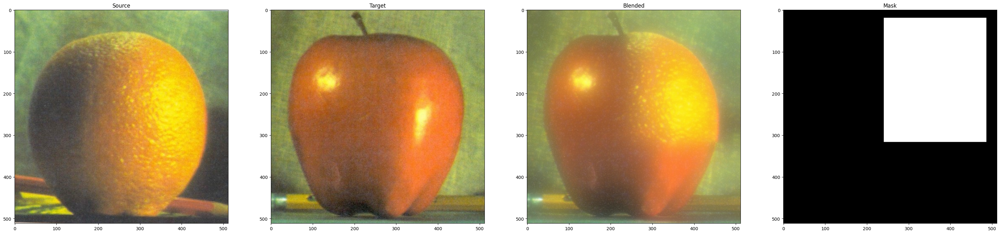

In [3]:
folder_num = 1
mask1 = cv2.imread(f"data/{folder_num}/mask.jpg")
A1 = cv2.imread(f"data/{folder_num}/target.jpg")
B1 = cv2.imread(f"data/{folder_num}/source.jpg")
mask = cv2.cvtColor(mask1, cv2.COLOR_BGR2RGB)
A1 = cv2.cvtColor(A1, cv2.COLOR_BGR2RGB)
B1 = cv2.cvtColor(B1, cv2.COLOR_BGR2RGB)
mask1 = mask1.astype(int) / 255
blend1 = image_blending(A1,B1,mask1,6)
visualize_blend(A1,B1,mask1,blend1)

## 2. Example 2

- Moved a cat to a different area from the picture it was in. Due to the tonal difference in the areas, there are certainties around the cat. To minimize this, the tone of the picture has gradually changed. It is an unsuccessful result compared to other examples.

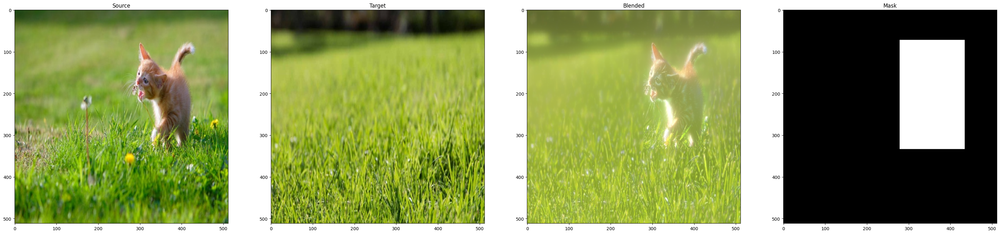

In [4]:
folder_num = 2
mask2 = cv2.imread(f"data/{folder_num}/mask.jpg")
A2 = cv2.imread(f"data/{folder_num}/target.jpg")
B2 = cv2.imread(f"data/{folder_num}/source.jpg")
mask = cv2.cvtColor(mask2, cv2.COLOR_BGR2RGB)
A2 = cv2.cvtColor(A2, cv2.COLOR_BGR2RGB)
B2 = cv2.cvtColor(B2, cv2.COLOR_BGR2RGB)
mask2 = mask2.astype(int) / 255
blend2 = image_blending(A2,B2,mask2,8)
visualize_blend(A2,B2,mask2,blend2)

## 2. Example 3

- An angry look has been added to the eyes of a smiling man. This made the photo very natural but strange. This painting is also very successful due to the similarity between the paintings. The picture taught was very natural.

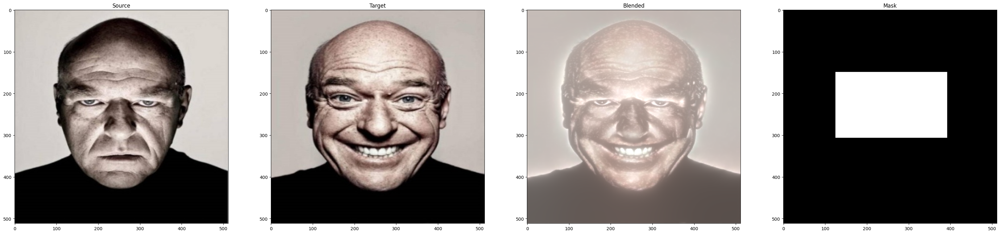

In [5]:
folder_num = 3
mask3 = cv2.imread(f"data/{folder_num}/mask.jpg")
A3 = cv2.imread(f"data/{folder_num}/target.jpg")
B3 = cv2.imread(f"data/{folder_num}/source.jpg")
mask3 = cv2.cvtColor(mask3, cv2.COLOR_BGR2RGB)
A3 = cv2.cvtColor(A3, cv2.COLOR_BGR2RGB)
B3 = cv2.cvtColor(B3, cv2.COLOR_BGR2RGB)
mask3 = mask3.astype(int) / 255
blend3 = image_blending(A3,B3,mask3,8)
visualize_blend(A3,B3,mask3,blend3)

## 2. Example 4

- Shows how to add crowd to a photo of an empty New York City center. The photo gave a pretty good result. Looking at the photo, it was not understood that it was artificial. But the awkwardness becomes noticeable when the crowd is only in one area.

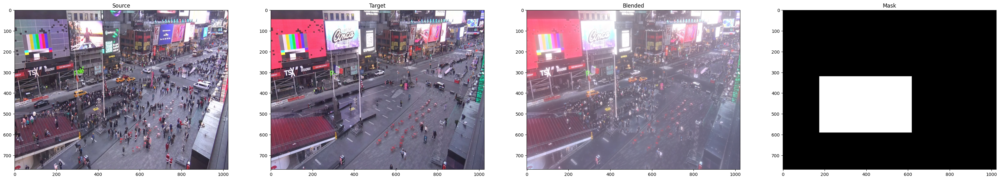

In [6]:
folder_num = 4
mask4 = cv2.imread(f"data/{folder_num}/mask.jpg")
A4 = cv2.imread(f"data/{folder_num}/target.jpg")
B4 = cv2.imread(f"data/{folder_num}/source.jpg")
mask4 = cv2.cvtColor(mask4, cv2.COLOR_BGR2RGB)
A4 = cv2.cvtColor(A4, cv2.COLOR_BGR2RGB)
B4 = cv2.cvtColor(B4, cv2.COLOR_BGR2RGB)
mask4 = mask4.astype(int) / 255
blend4 = image_blending(A4,B4,mask4,8)
visualize_blend(A4,B4,mask4,blend4)

## 2. Example 5

- Balloons shot in Nevşehir were added to a nature painting. The picture, which seems natural at first, can be considered unsuccessful in details. But still a good result is observed.

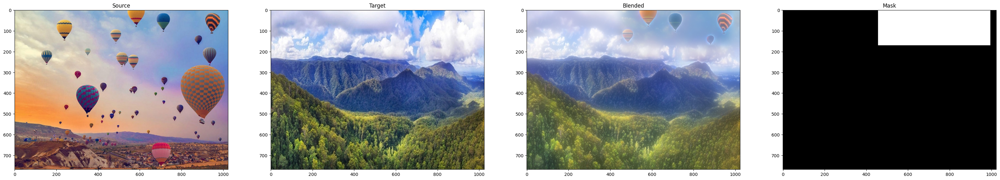

In [7]:
folder_num = 5
mask5 = cv2.imread(f"data/{folder_num}/mask.jpg")
A5 = cv2.imread(f"data/{folder_num}/target.jpg")
B5 = cv2.imread(f"data/{folder_num}/source.jpg")
mask5 = cv2.cvtColor(mask5, cv2.COLOR_BGR2RGB)
A5 = cv2.cvtColor(A5, cv2.COLOR_BGR2RGB)
B5 = cv2.cvtColor(B5, cv2.COLOR_BGR2RGB)
mask5 = mask5.astype(int) / 255
blend4 = image_blending(A5,B5,mask5,6)
visualize_blend(A5,B5,mask5,blend4)

## 3. Pyramid Levels Affect

- The results with the different levels are shown below, side by side. In the ones for the 4th level, we can see the borders as a line. When we look at the 6th level, we see that the clear boundaries have disappeared. When we look at the 8th level, it is seen that there is a large section between source and target.

In [8]:
def visualize(A,B,mask):
    blend1 = image_blending(A,B,mask,4)
    blend2 = image_blending(A,B,mask,6)
    blend3 = image_blending(A,B,mask,8) 


    f, axarr = plt.subplots(1,3, figsize=(15,3.5))
    axarr[0].imshow(blend1)
    axarr[1].imshow(blend2)
    axarr[2].imshow(blend3)

    axarr[0].title.set_text(f"The Level : 4")
    axarr[1].title.set_text(f"The Level : 6")
    axarr[2].title.set_text(f"The Level : 8")


- As the level increases, it is observed that the more the combination in the photo increases. Looking at the 4th level, the edges are very clear. But there are more natural transitions as you go to level 8.

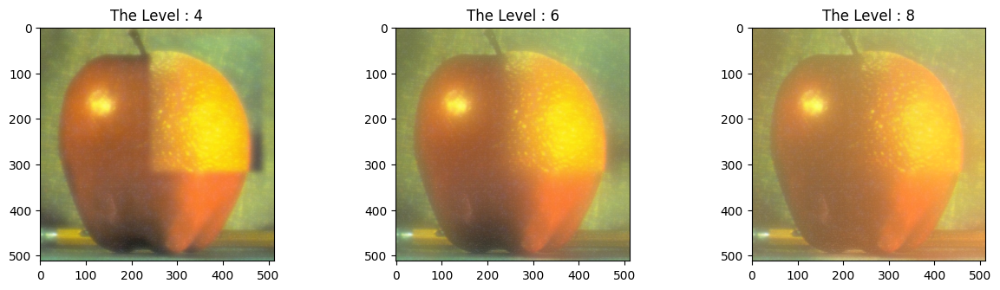

In [9]:
visualize(A1,B1,mask1)

- Due to the difference in the tones of the photograph, the tonal difference was tried to be equalized as the level increased.

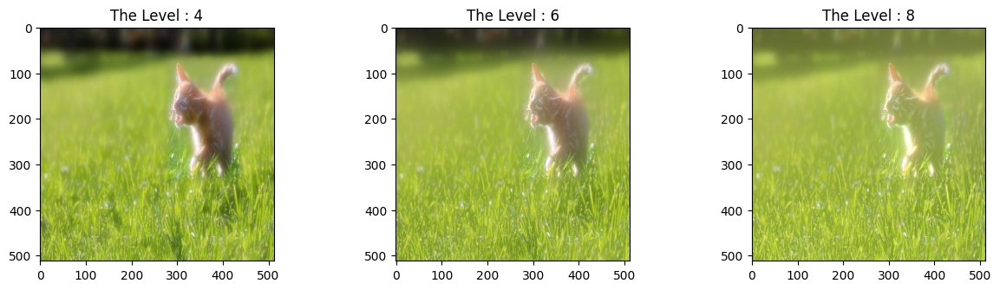

In [10]:
visualize(A2,B2,mask2)

- There is a skin difference between the source image and the target image. This difference decreased as the level increased. Thus, a very successful example of high level has emerged.

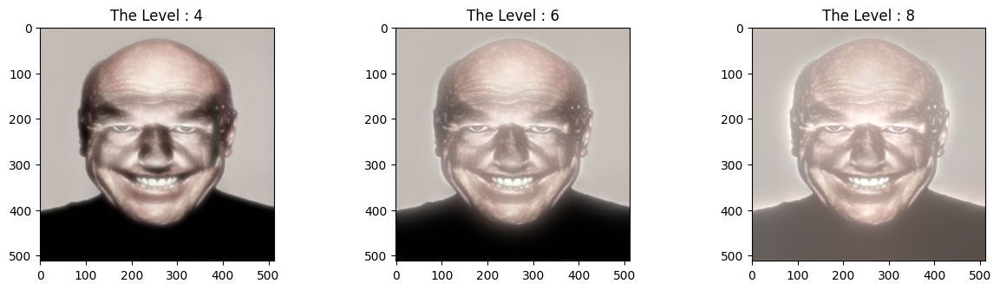

In [11]:
visualize(A3,B3,mask3)

- At the 4th level, you can select the crowd, while at other levels the crowd is integrated with the picture.

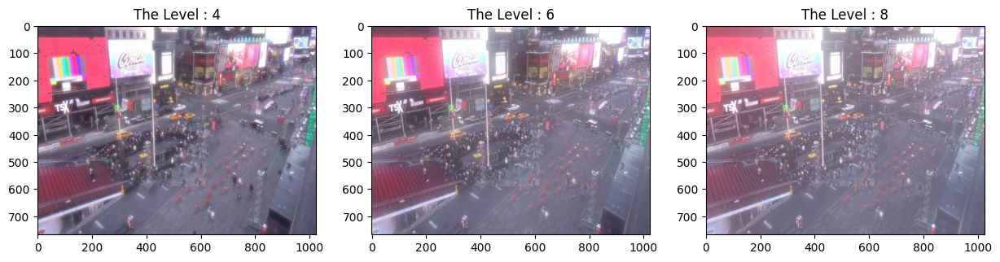

In [12]:
visualize(A4,B4,mask4)

- As you look at the levels, it is seen that the sky difference decreases. But in the 8th picture, the circumference of the balloons is very evident. Level 6 seems to be more successful at this point.

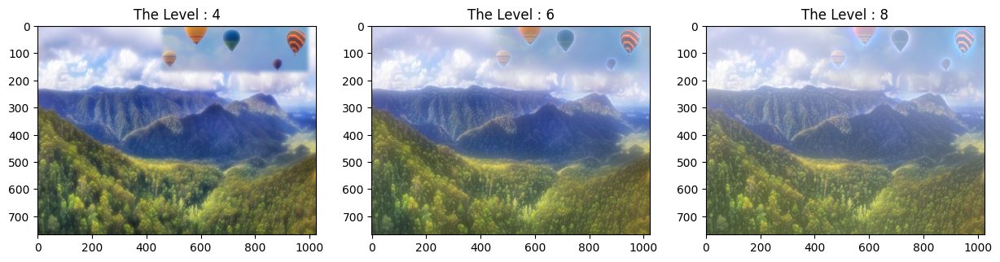

In [13]:
visualize(A5,B5,mask5)

## 4. Select a Region to create Image Mask

- 1.Choose a sample image folder.
- 2.Fix the size of the images.
- 3.Show target image.
- 4.Select the area you want to crop with the mouse.
- 5.Press enter and the mask will be saved automatically.

Note : It has been commented to be able to Restart and Run All. It can be removed from the comment and used.

In [14]:
# folder_num = 5
# dim = (1024,768)

# A = cv2.imread(f"data/{folder_num}/target.jpg")
# B = cv2.imread(f"data/{folder_num}/source.jpg")
# A = cv2.resize(A, dim, interpolation = cv2.INTER_AREA)
# B = cv2.resize(B, dim, interpolation = cv2.INTER_AREA)
# cv2.imwrite(f"data/{folder_num}/target.jpg", A)
# cv2.imwrite(f"data/{folder_num}/source.jpg", B)


# image = cv2.imread(f"data/{folder_num}/target.jpg")
# r = cv2.selectROI("select the area of mask", image)
# mask = np.zeros(image.shape[:2], dtype="uint8")
# cv2.rectangle(mask, (int(r[0]),int(r[1])), (int(r[0]+r[2]),int(r[1]+r[3])), (255,0,0), -1)

# cv2.imwrite(f"data/{folder_num}/mask.jpg", mask)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

## 5. References



[1] [OpenCV Python Tutorial For Beginners 22 - Image Blending using Pyramids in OpenCV](https://www.youtube.com/watch?v=HfM9s2ehErE)

[2] [Image Pyramids and Blending](http://graphics.cs.cmu.edu/courses/15-463/2005_fall/www/Lectures/Pyramids.pdf)